In [1]:
import os
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd

import rasterio
from rasterio.transform import from_origin

import shapely.vectorized as sv

import cartopy.crs as ccrs

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec

import sys
sys.path.append(os.path.abspath(".."))
from function import DOWN_raw

## Export maps for 10, 50, 100 and 200 years

In [2]:
yy_s, yy_e = 2002, 2023
years_num = yy_e - yy_s + 1

npix = 2
acf = 'mar'
cor = 'pearson'

lon_min, lon_max, lat_min, lat_max, area, toll = 6.5, 19, 36.5, 48, 'ITALY', 0.002
Tr = [5,  10,  20,  50, 100, 200]

In [3]:
dir_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','5_DOWN')

In [4]:
veneto_dir = os.path.join('/','media','arturo','T9','Data','shapes','Europa','Italy')

if os.path.exists(veneto_dir):
    REGIONS = gpd.read_file(os.path.join(veneto_dir,'Italy_regions.geojson'))
    ITALY = gpd.read_file(os.path.join(veneto_dir,'Italy_clear.geojson'))
else:
    raise SystemExit(f"File not found: {veneto_dir}")

italy_geom = ITALY.union_all()

## LOAD MEVD RESULTS

In [5]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_IMERG_1dy_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_{cor}.nc')
DATA = xr.open_dataset(data_dir)
lons_IM, lats_IM = DATA.lon.values, DATA.lat.values
lon2d_IM, lat2d_IM = np.meshgrid(lons_IM, lats_IM)

mask_italy = sv.contains(italy_geom, lon2d_IM, lat2d_IM)

MEVs_IM = DATA.Mev_s
MEVs_IM = MEVs_IM.where(mask_italy)

MEVd_IM = DATA.Mev_d
MEVd_IM = MEVd_IM.where(mask_italy)

In [6]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_CMORPH_3h_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_{cor}.nc')
DATA = xr.open_dataset(data_dir)
lons_CM, lats_CM = DATA.lon.values, DATA.lat.values
lon2d_CM, lat2d_CM = np.meshgrid(lons_CM, lats_CM)

mask_italy = sv.contains(italy_geom, lon2d_CM, lat2d_CM)

MEVs_CM = DATA.Mev_s
MEVs_CM = MEVs_CM.where(mask_italy)

MEVd_CM = DATA.Mev_d
MEVd_CM = MEVd_CM.where(mask_italy)

In [7]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_MSWEP_3h_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_{cor}.nc')
DATA = xr.open_dataset(data_dir)
lons_MS, lats_MS = DATA.lon.values, DATA.lat.values
lon2d_MS, lat2d_MS = np.meshgrid(lons_MS, lats_MS)

mask_italy = sv.contains(italy_geom, lon2d_MS, lat2d_MS)

MEVs_MS = DATA.Mev_s
MEVs_MS = MEVs_MS.where(mask_italy)

MEVd_MS = DATA.Mev_d
MEVd_MS = MEVd_MS.where(mask_italy)

In [8]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_ERA5_3h_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_{cor}.nc')
DATA = xr.open_dataset(data_dir)
lons_ER, lats_ER = DATA.lon.values, DATA.lat.values
lon2d_ER, lat2d_ER = np.meshgrid(lons_ER, lats_ER)

mask_italy = sv.contains(italy_geom, lon2d_ER, lat2d_ER)

MEVs_ER = DATA.Mev_s
MEVs_ER = MEVs_ER.where(mask_italy)

MEVd_ER = DATA.Mev_d
MEVd_ER = MEVd_ER.where(mask_italy)

In [9]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_GSMaP_3h_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_{cor}.nc')
DATA = xr.open_dataset(data_dir)
lons_GS, lats_GS = DATA.lon.values, DATA.lat.values
lon2d_GS, lat2d_GS = np.meshgrid(lons_GS, lats_GS)

mask_italy = sv.contains(italy_geom, lon2d_GS, lat2d_GS)

MEVs_GS = DATA.Mev_s
MEVs_GS = MEVs_GS.where(mask_italy)

MEVd_GS = DATA.Mev_d
MEVd_GS = MEVd_GS.where(mask_italy)

In [10]:
data_dir = os.path.join(dir_base, f'ITALY_DOWN_CHIRPS_1dy_{yy_s}_{yy_e}_npix_{npix}_thr_1_acf_{acf}_genetic_pearson.nc')
DATA = xr.open_dataset(data_dir)
lons_CH, lats_CH = DATA.lon.values, DATA.lat.values
lon2d_CH, lat2d_CH = np.meshgrid(lons_CH, lats_CH)

mask_italy = sv.contains(italy_geom, lon2d_CH, lat2d_CH)

MEVs_CH = DATA.Mev_s
MEVs_CH = MEVs_CH.where(MEVs_CH != 0)
MEVs_CH = MEVs_CH.where(mask_italy)

MEVd_CH = DATA.Mev_d
MEVd_CH = MEVd_CH.where(MEVd_CH != 0)
MEVd_CH = MEVd_CH.where(mask_italy)

## RAW and DOWN 10 years

Return Time: 10 years
Export figure to: ../figures/INTENSE/MEVD_10yrs_raw_scale.png


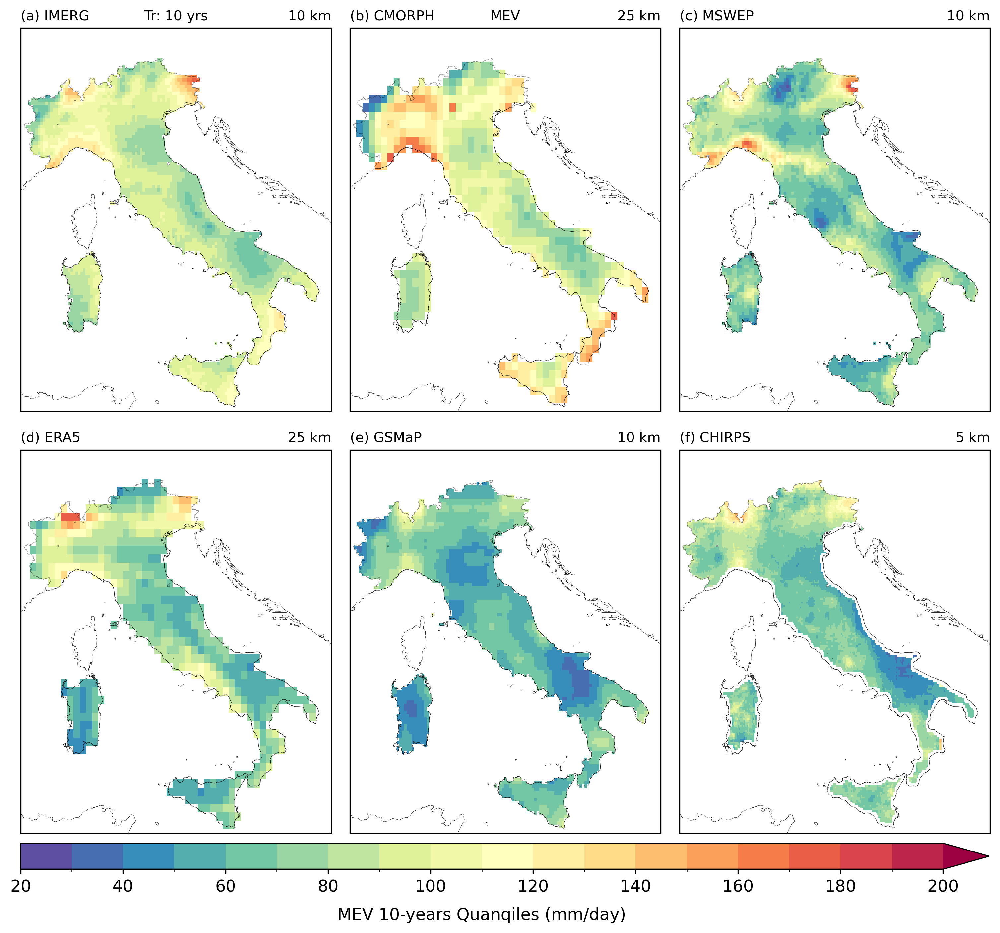

In [46]:
pos = 1
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 210, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV 10-years Quanqiles (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Return Time: 10 years
Export figure to: ../figures/INTENSE/MEVD_10yrs_point_scale.png


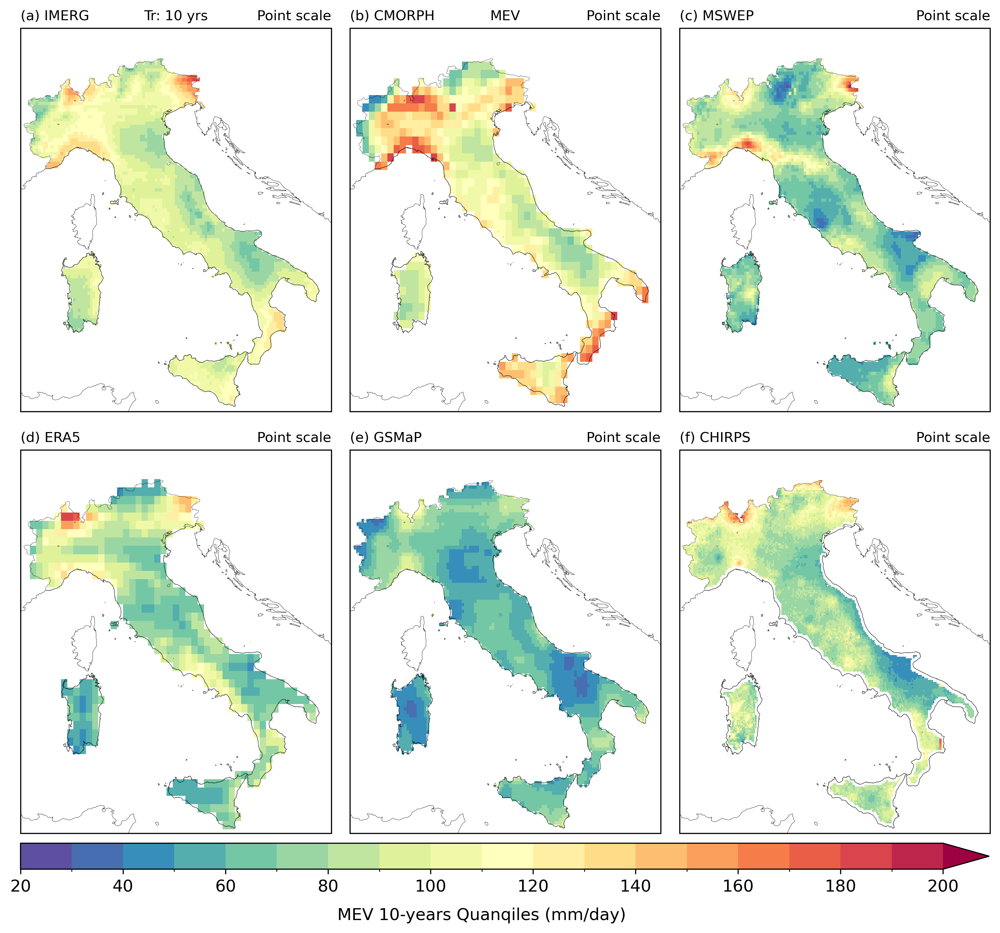

In [47]:
pos = 1
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 210, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'Point scale', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV 10-years Quanqiles (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_point_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## RAW and DOWN 50 Years

Return Time: 50 years
Export figure to: ../figures/INTENSE/MEVD_50yrs_raw_scale.png


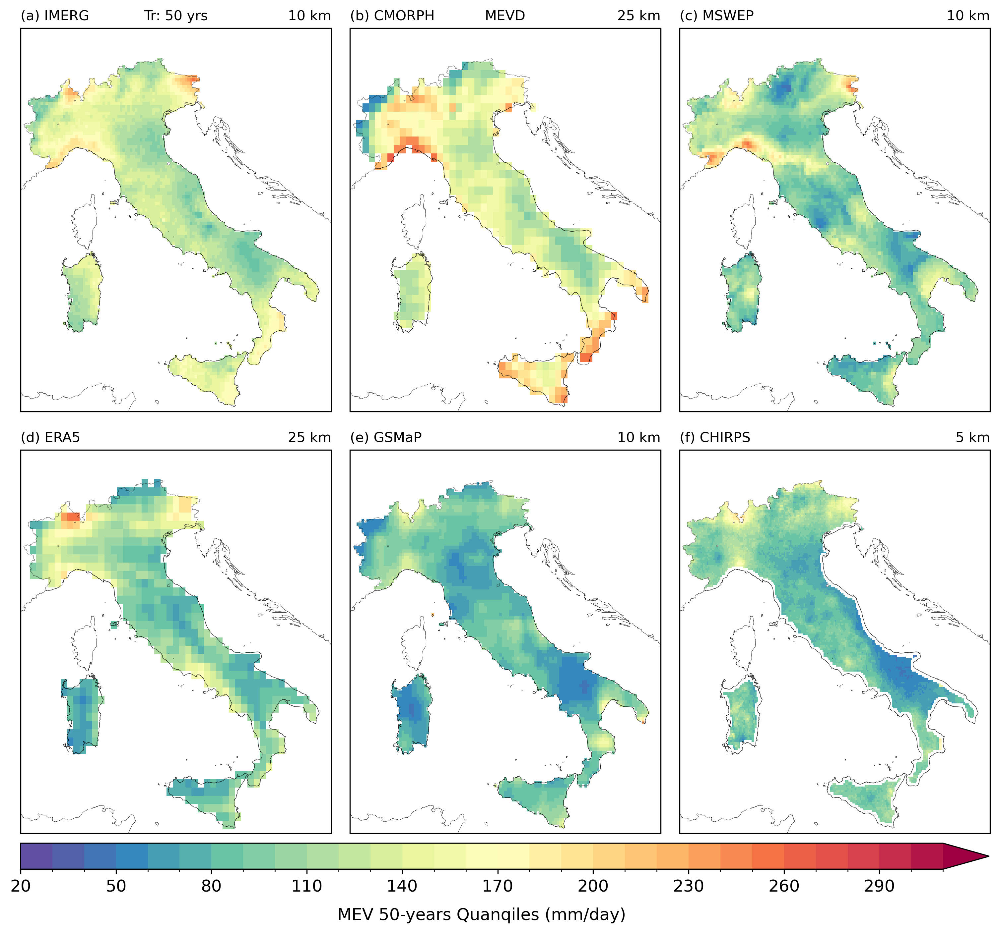

In [59]:
pos = 3
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 320, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEVD', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV 50-years Quanqiles (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Return Time: 50 years
Export figure to: ../figures/INTENSE/MEVD_50yrs_point_scale.png


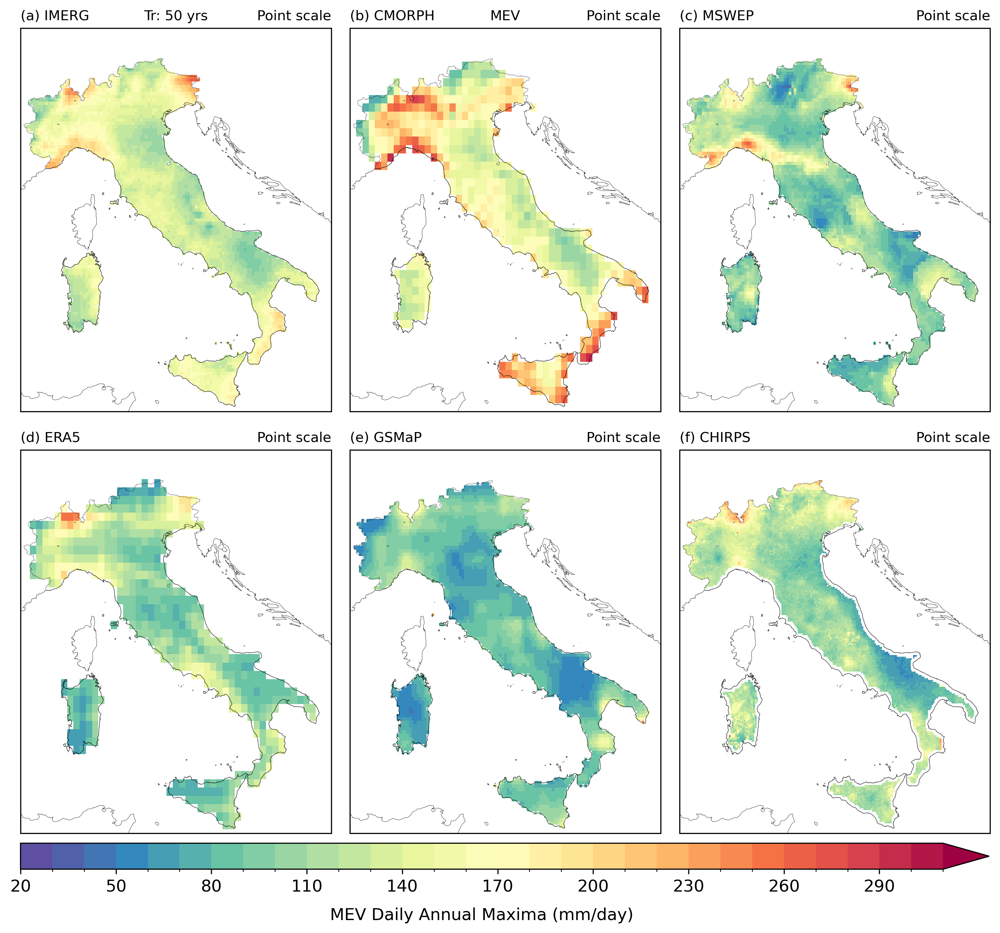

In [14]:
pos = 3
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 320, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'Point scale', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_point_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## RAW and DOWN 100 years

Return Time: 100 years
Export figure to: ../figures/INTENSE/MEVD_100yrs_raw_scale.png


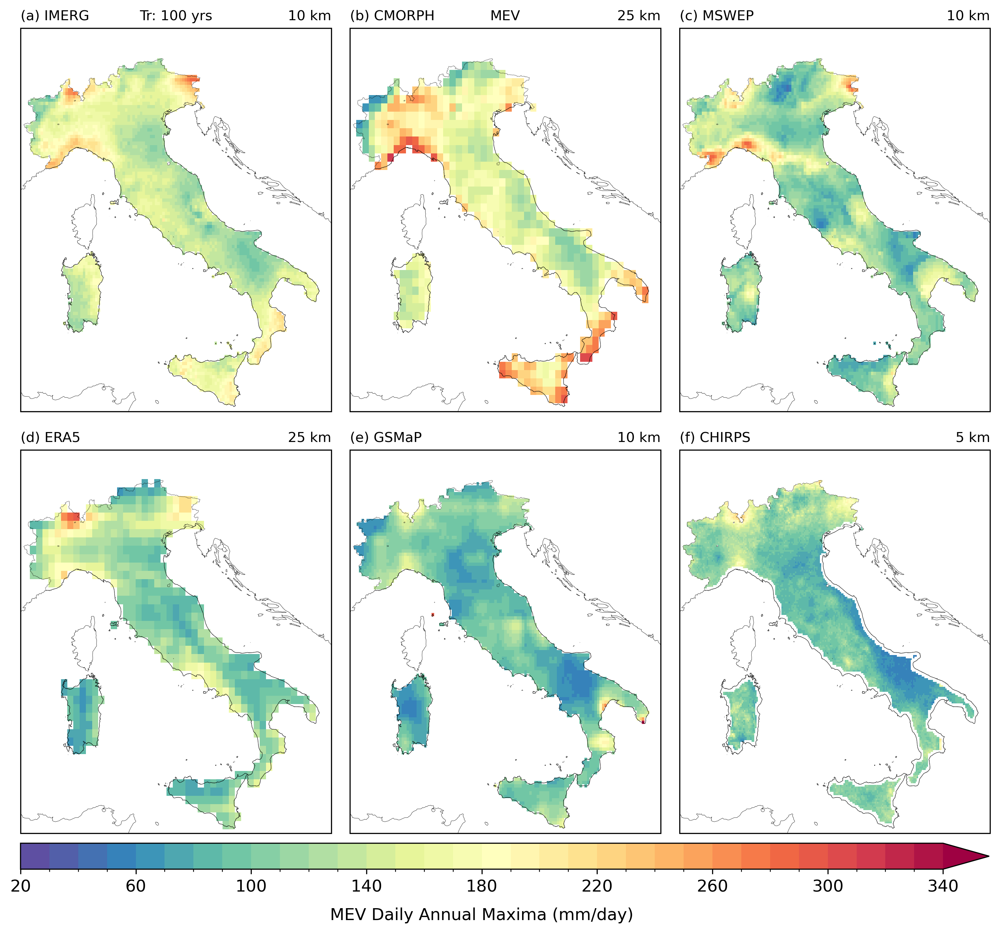

In [15]:
pos = 4
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 350, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Return Time: 100 years
Export figure to: ../figures/INTENSE/MEVD_100yrs_point_scale.png


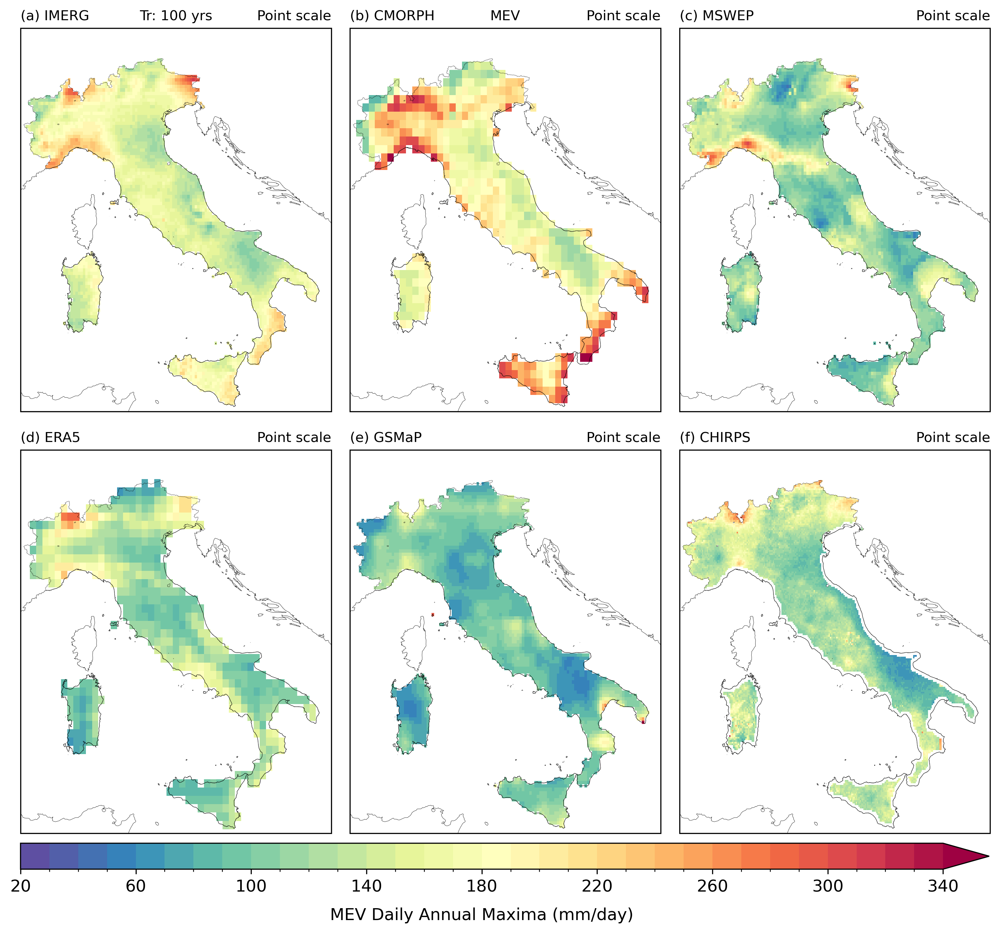

In [16]:
pos = 4
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 350, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'Point scale', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_point_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## RAW and DOWN 200 years

Return Time: 200 years
Export figure to: ../figures/INTENSE/MEVD_200yrs_raw_scale.png


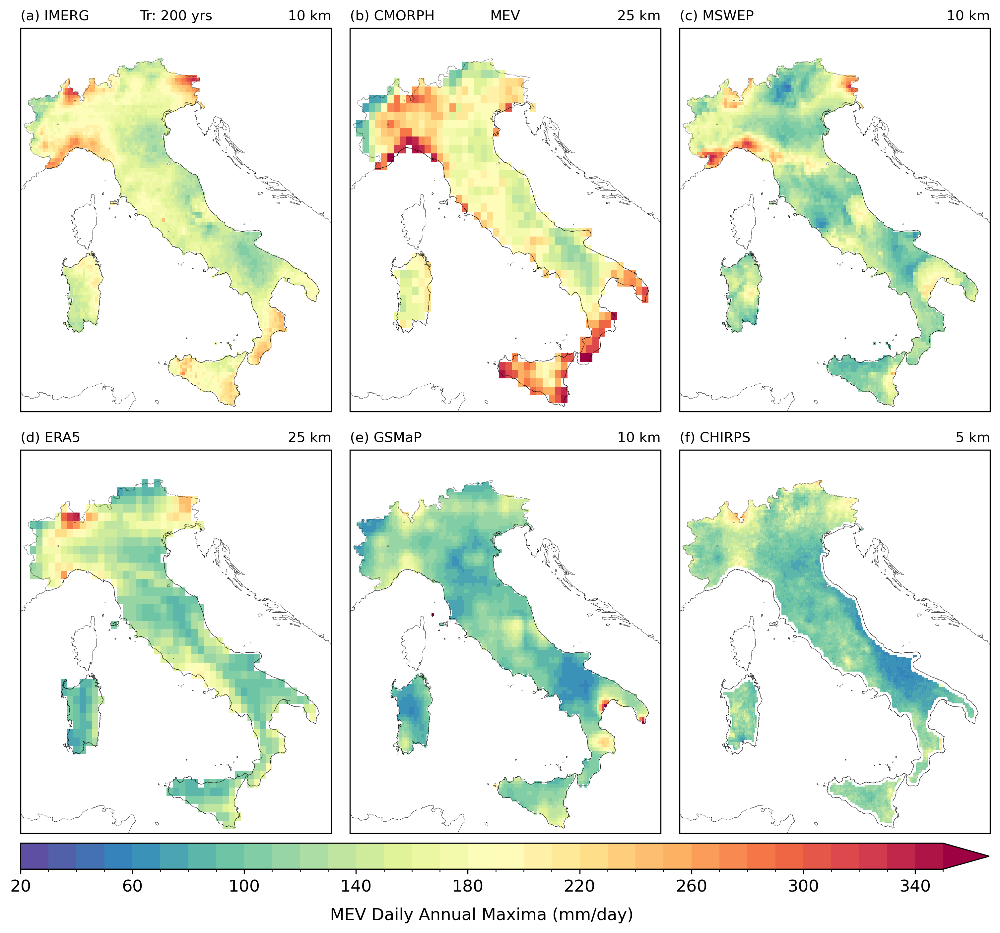

In [17]:
pos = 5
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 360, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Return Time: 200 years
Export figure to: ../figures/INTENSE/MEVD_200yrs_point_scale.png


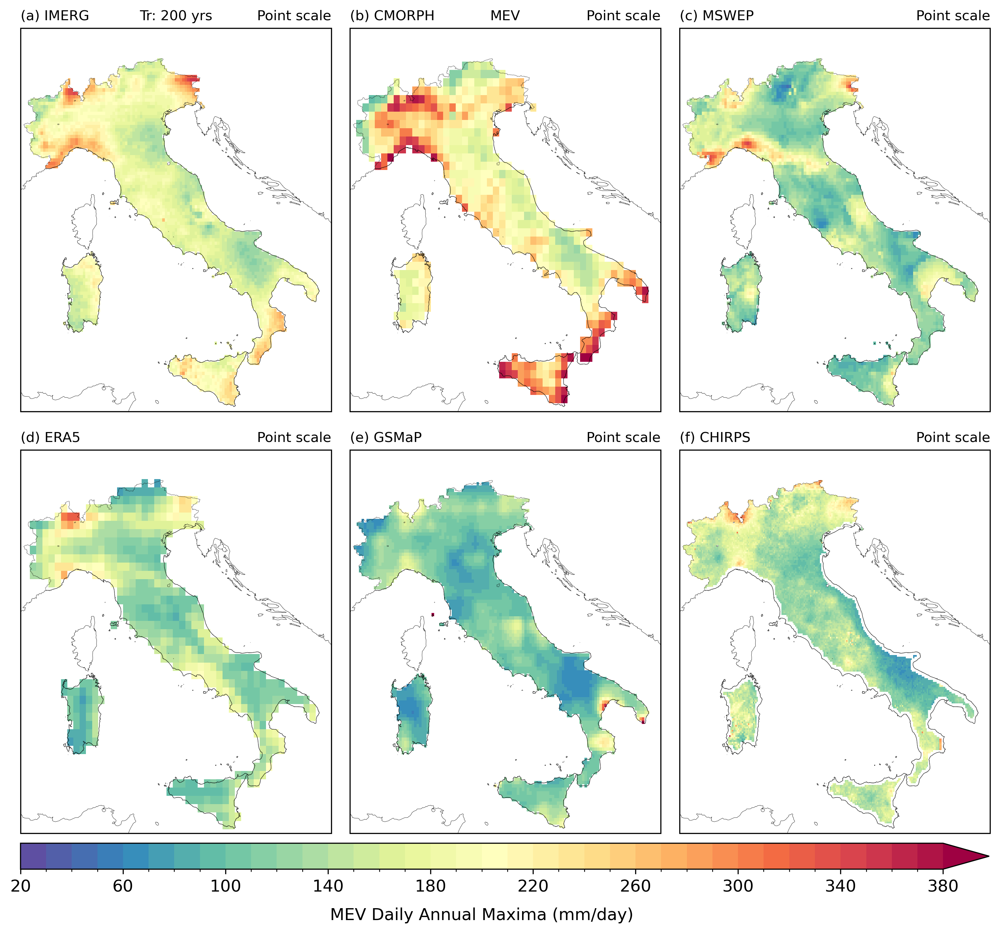

In [18]:
pos = 5
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 390, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'Point scale', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'Point scale', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'MEVD_{Tr[pos]}yrs_point_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## Exporting data as geotiff

In [19]:
def export_geotiff(DATA, lats, lons, nameout, out_dir = "../output/geotiff"):

    lon_res = lons[1] - lons[0]
    lat_res = lats[1] - lats[0]

    transform = from_origin(
        lons.min() - lon_res / 2,
        lats.max() + lat_res / 2,
        lon_res,
        lat_res
    )

    file_out = os.path.join(out_dir, f'{nameout}.tif')
    with rasterio.open(
        file_out,
        "w",
        driver="GTiff",
        height=DATA.shape[0],
        width=DATA.shape[1],
        count=1,
        dtype=DATA.dtype,
        crs="EPSG:4326",
        transform=transform,
        nodata=np.nan
    ) as dst:
        dst.write(DATA, 1)

    print(f'Export as: {file_out}')

## MEVD Export as Geotiff

In [20]:
pos_list = [1, 3, 4, 5]

In [ ]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVs = MEVs_IM[pos, :, :].values
    file_name = f'IMERG_MEVs_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_IM, lons_IM, file_name)

    dataMEVd = MEVd_IM[pos, :, :].values
    file_name = f'IMERG_MEVd_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_IM, lons_IM, file_name)

Return time: 10 years
Export as: ../output/geotiff/IMERG_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/IMERG_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/IMERG_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/IMERG_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/IMERG_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/IMERG_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/IMERG_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/IMERG_MEVd_200_yrs_point.tif


In [22]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVd = MEVd_CM[pos, :, :].values
    file_name = f'CMORPH_MEVs_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_CM, lons_CM, file_name)

    dataMEVs = MEVs_CM[pos, :, :].values
    file_name = f'CMORPH_MEVd_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_CM, lons_CM, file_name)

Return time: 10 years
Export as: ../output/geotiff/CMORPH_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/CMORPH_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/CMORPH_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/CMORPH_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/CMORPH_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/CMORPH_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/CMORPH_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/CMORPH_MEVd_200_yrs_point.tif


In [23]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVd = MEVd_MS[pos, :, :].values
    file_name = f'MSWEP_MEVs_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_MS, lons_MS, file_name)

    dataMEVs = MEVs_MS[pos, :, :].values
    file_name = f'MSWEP_MEVd_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_MS, lons_MS, file_name)

Return time: 10 years
Export as: ../output/geotiff/MSWEP_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/MSWEP_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/MSWEP_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/MSWEP_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/MSWEP_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/MSWEP_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/MSWEP_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/MSWEP_MEVd_200_yrs_point.tif


In [24]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVd = MEVd_ER[pos, :, :].values
    file_name = f'ERA5_MEVs_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_ER, lons_ER, file_name)

    dataMEVs = MEVs_ER[pos, :, :].values
    file_name = f'ERA5_MEVd_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_ER, lons_ER, file_name)

Return time: 10 years
Export as: ../output/geotiff/ERA5_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/ERA5_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/ERA5_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/ERA5_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/ERA5_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/ERA5_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/ERA5_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/ERA5_MEVd_200_yrs_point.tif


In [25]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVd = MEVd_GS[pos, :, :].values
    file_name = f'GSMaP_MEVs_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_GS, lons_GS, file_name)

    dataMEVs = MEVs_GS[pos, :, :].values
    file_name = f'GSMaP_MEVd_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_GS, lons_GS, file_name)

Return time: 10 years
Export as: ../output/geotiff/GSMaP_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/GSMaP_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/GSMaP_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/GSMaP_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/GSMaP_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/GSMaP_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/GSMaP_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/GSMaP_MEVd_200_yrs_point.tif


In [26]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataMEVd = MEVd_CH[pos, :, :].values
    file_name = f'CHIRPS_MEVs_{Tr[pos]}_yrs_10km'
    export_geotiff(dataMEVd, lats_CH, lons_CH, file_name)

    dataMEVs = MEVs_CH[pos, :, :].values
    file_name = f'CHIRPS_MEVd_{Tr[pos]}_yrs_point'
    export_geotiff(dataMEVs, lats_CH, lons_CH, file_name)

Return time: 10 years
Export as: ../output/geotiff/CHIRPS_MEVs_10_yrs_10km.tif
Export as: ../output/geotiff/CHIRPS_MEVd_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/CHIRPS_MEVs_50_yrs_10km.tif
Export as: ../output/geotiff/CHIRPS_MEVd_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/CHIRPS_MEVs_100_yrs_10km.tif
Export as: ../output/geotiff/CHIRPS_MEVd_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/CHIRPS_MEVs_200_yrs_10km.tif
Export as: ../output/geotiff/CHIRPS_MEVd_200_yrs_point.tif


## GEV

In [27]:
sat_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite')

In [28]:
Tr = [5,  10,  20,  50, 100, 200]
Fi = 1 - 1/np.array(Tr)

In [29]:
import scipy as sc
from numpy.linalg import inv

def hess(fun, y, data):
    ''' numeric Hessian matrix
    for estimating MLE parameters confidence intervals'''
    ep = 0.0001
    x = np.array(y)
    eps = ep*x
    n = np.size(x)
    m = np.zeros((n,n))
    x1 = np.zeros(n)
    x2 = np.zeros(n)
    x3 = np.zeros(n)
    x4 = np.zeros(n)
    for i in range(n):
        for j in range(n):
            x1[:] = x[:]
            # I modify the original array as well - it is a view!
            x1[i] = x1[i] + eps[i]
            x1[j] = x1[j] + eps[j]
            x2[:] = x[:]
            x2[i] = x2[i] + eps[i]
            x2[j] = x2[j] - eps[j]
            x3[:] = x[:]
            x3[i] = x3[i] - eps[i]
            x3[j] = x3[j] + eps[j]
            x4[:] = x[:]
            x4[i] = x4[i] - eps[i]
            x4[j] = x4[j] - eps[j]
            m[i,j] = (fun(x1, data) -fun(x2, data) - fun(x3, data) + fun(x4, data))/(4*eps[i]*eps[j]) 
    M = np.asmatrix(m)
    return inv(M)

def gev_fit_ml(data, std = False):
    ''' fit GEV by means of ML estimation to an array of observations (data)
    e.g., of annual maxima
    return GEV parameters -->  parhat = (csi, psi, mu)
    shape csi (>0 Frechet), scale psi, and location mu'
    and if stdv = True (optional) it does also return their stdv
    parstd = (std_csi, std_psi, std_mu)
    and their covariance matrix'''    
    # first guess with method of moments
    sigma0 = np.sqrt((6*np.var(data))/np.pi)
    mu0    = np.mean(data) - 0.57722 * sigma0
    xi0    = 0.1
    theta  =[xi0,sigma0,mu0]
    
    y = 1 + (theta[0] * (data - theta[2]))/theta[1]
    if theta[1] < 0.0 or np.min(y) < 0.0:
        theta[1] = 1
        theta[2] = 1
    
    ###########################################################################
    # neg log likelihood function          
    def negloglikegev(theta, data):
        y = 1 + (theta[0] * (data - theta[2]))/theta[1]
        if theta[1] < 0.0 or np.min(y) < 0.0:
            c= np.inf
        else: 
            term1 = len(data) * np.log(theta[1])
            term2 = np.sum((1 + 1/theta[0]) * np.log(y))
            term3 = np.sum(y**(-1/theta[0]))
            c = term1 + term2 + term3
        return c        
    ###########################################################################   
    
    nllg = lambda theta: negloglikegev(theta, data)
    res = sc.optimize.minimize(nllg, theta, method='nelder-mead', 
                                        options={'xtol': 1e-8, 'disp': False})
    
    parhat = res.x # MLE PARAMETERS
    # csi = res.x[0] # GEV shape (>0 Frechet)
    # psi = res.x[1] # GEV scale
    # mu = res.x[2] # GEV shape location
    
    # OPTIONAL - COVARIANCE OF ESTIMATED PARAMETERS
    if std:
        varcov = hess(negloglikegev, parhat, data)
        parstd = np.sqrt( np.diag(varcov) )
        return parhat, parstd, varcov
    else:
        return parhat

In [30]:
# csi1, psi1, mu1 = gev_fit_ml(serie)
# csi1, psi1, mu1 

In [31]:
# csi1, psi1, mu1 = DOWN_raw.gev_fit_lmom(serie)
# csi1, psi1, mu1

In [32]:
dir_in = os.path.join(sat_base, 'IMERG', '1dy', 'IMERG_Italy_1dy_2000_06_01_2024_02_29.nc')
DATA = xr.open_dataset(dir_in)

lon2dIM, lat2dIM = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dIM, lat2dIM)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

IMERG_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = PRE[:,i,j][PRE[:,i,j] > 1] - 1
        csi1, psi1, mu1 = DOWN_raw.gev_fit_lmom(serie)
        csi2, psi2, mu2 = DOWN_raw.gev_fit(serie)

In [33]:
NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)
NY_max.shape

(25, 121, 131)

In [34]:
dir_in = os.path.join(sat_base, 'IMERG', '1dy', 'IMERG_Italy_1dy_2000_06_01_2024_02_29.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dIM, lat2dIM = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dIM, lat2dIM)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

IMERG_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = NY_max[:,i,j][NY_max[:,i,j] > 1] - 1
        csi, psi, mu = DOWN_raw.gev_fit_lmom(serie)
        # csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        IMERG_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

IMERG_GEV = np.where(mask_italy[None, :, :],IMERG_GEV,np.nan)

In [35]:
dir_in = os.path.join(sat_base, 'CMORPH', '1dy', 'CMORPH_Italy_1dy_1998_01_01_2024_01_31.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dCM, lat2dCM = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dCM, lat2dCM)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

CMORPH_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = NY_max[:,i,j][NY_max[:,i,j] > 1] - 1
        csi, psi, mu = DOWN_raw.gev_fit_lmom(serie)
        # csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        CMORPH_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

CMORPH_GEV = np.where(mask_italy[None, :, :],CMORPH_GEV,np.nan)

In [36]:
dir_in = os.path.join(sat_base, 'MSWEP', '1dy', 'MSWEP_Italy_1dy_1980_01_01_2023_12_31.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dMS, lat2dMS = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dMS, lat2dMS)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

MSWEP_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = NY_max[:,i,j][NY_max[:,i,j] > 1] - 1
        csi, psi, mu = DOWN_raw.gev_fit_lmom(serie)
        # csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        MSWEP_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

MSWEP_GEV = np.where(mask_italy[None, :, :],MSWEP_GEV,np.nan)

In [37]:
dir_in = os.path.join(sat_base, 'ERA5', '1dy', 'ERA5_Italy_1dy_2000_01_01_2023_12_31.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dER, lat2dER = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dER, lat2dER)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

ERA5_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = NY_max[:,i,j][NY_max[:,i,j] > 1] - 1
        csi, psi, mu = DOWN_raw.gev_fit_lmom(serie)
        # csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        ERA5_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

ERA5_GEV = np.where(mask_italy[None, :, :],ERA5_GEV,np.nan)

In [38]:
dir_in = os.path.join(sat_base, 'GSMaP', '1dy', 'GSMaP_Italy_1dy_2002_01_01_2024_12_31.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dGS, lat2dGS = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dGS, lat2dGS)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

GSMaP_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        serie = NY_max[:,i,j][NY_max[:,i,j] > 1] - 1
        csi, psi, mu = DOWN_raw.gev_fit_lmom(serie)
        # csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        GSMaP_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

GSMaP_GEV = np.where(mask_italy[None, :, :],GSMaP_GEV,np.nan)

In [39]:
dir_in = os.path.join(sat_base, 'CHIRPS', '1dy', 'CHIRPS_Italy_1dy_1981_01_01_2024_06_30.nc')
DATA = xr.open_dataset(dir_in)

NY_max = DATA['PRE'].groupby('time.year').max(dim='time', skipna=True)

lon2dCH, lat2dCH = np.meshgrid(DATA.lon.values, DATA.lat.values)
mask_italy = sv.contains(italy_geom, lon2dCH, lat2dCH)

# PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(NY_max)

CHIRPS_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        tmp = NY_max[:,i,j][NY_max[:,i,j] > 1.0]
        if len(tmp) == 0:
            CHIRPS_GEV[:,i,j] = np.nan
        else:
            serie = tmp - 1
            csi, psi, mu = DOWN_raw.gev_fit_lmom(tmp)
            # csi, psi, mu = DOWN_raw.gev_fit_lmom(tmp)
            CHIRPS_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

CHIRPS_GEV = np.where(mask_italy[None, :, :],CHIRPS_GEV,np.nan)

In [52]:
pos_list = [1, 3, 4, 5]

In [53]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = IMERG_GEV[pos, :, :]
    file_name = f'IMERG_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_IM, lons_IM, file_name)

Return time: 10 years
Export as: ../output/geotiff/IMERG_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/IMERG_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/IMERG_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/IMERG_GEV_200_yrs_point.tif


In [ ]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = CMORPH_GEV[pos, :, :]
    file_name = f'CMORPH_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_CM, lons_CM, file_name)

Return time: 10 years
Export as: ../output/geotiff/CMORPH_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/CMORPH_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/CMORPH_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/CMORPH_GEV_200_yrs_point.tif


In [60]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = MSWEP_GEV[pos, :, :]
    file_name = f'MSWEP_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_MS, lons_MS, file_name)

Return time: 10 years
Export as: ../output/geotiff/MSWEP_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/MSWEP_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/MSWEP_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/MSWEP_GEV_200_yrs_point.tif


In [55]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = ERA5_GEV[pos, :, :]
    file_name = f'ERA5_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_ER, lons_ER, file_name)

Return time: 10 years
Export as: ../output/geotiff/ERA5_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/ERA5_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/ERA5_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/ERA5_GEV_200_yrs_point.tif


In [56]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = GSMaP_GEV[pos, :, :]
    file_name = f'GSMaP_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_GS, lons_GS, file_name)

Return time: 10 years
Export as: ../output/geotiff/GSMaP_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/GSMaP_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/GSMaP_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/GSMaP_GEV_200_yrs_point.tif


In [57]:
for pos in pos_list:
    print(f'Return time: {Tr[pos]} years')

    dataGEV = CHIRPS_GEV[pos, :, :]
    file_name = f'CHIRPS_GEV_{Tr[pos]}_yrs_point'
    export_geotiff(dataGEV, lats_CH, lons_CH, file_name)

Return time: 10 years
Export as: ../output/geotiff/CHIRPS_GEV_10_yrs_point.tif
Return time: 50 years
Export as: ../output/geotiff/CHIRPS_GEV_50_yrs_point.tif
Return time: 100 years
Export as: ../output/geotiff/CHIRPS_GEV_100_yrs_point.tif
Return time: 200 years
Export as: ../output/geotiff/CHIRPS_GEV_200_yrs_point.tif


Return Time: 10 years
Export figure to: ../figures/INTENSE/GEV_10yrs_raw_scale.png


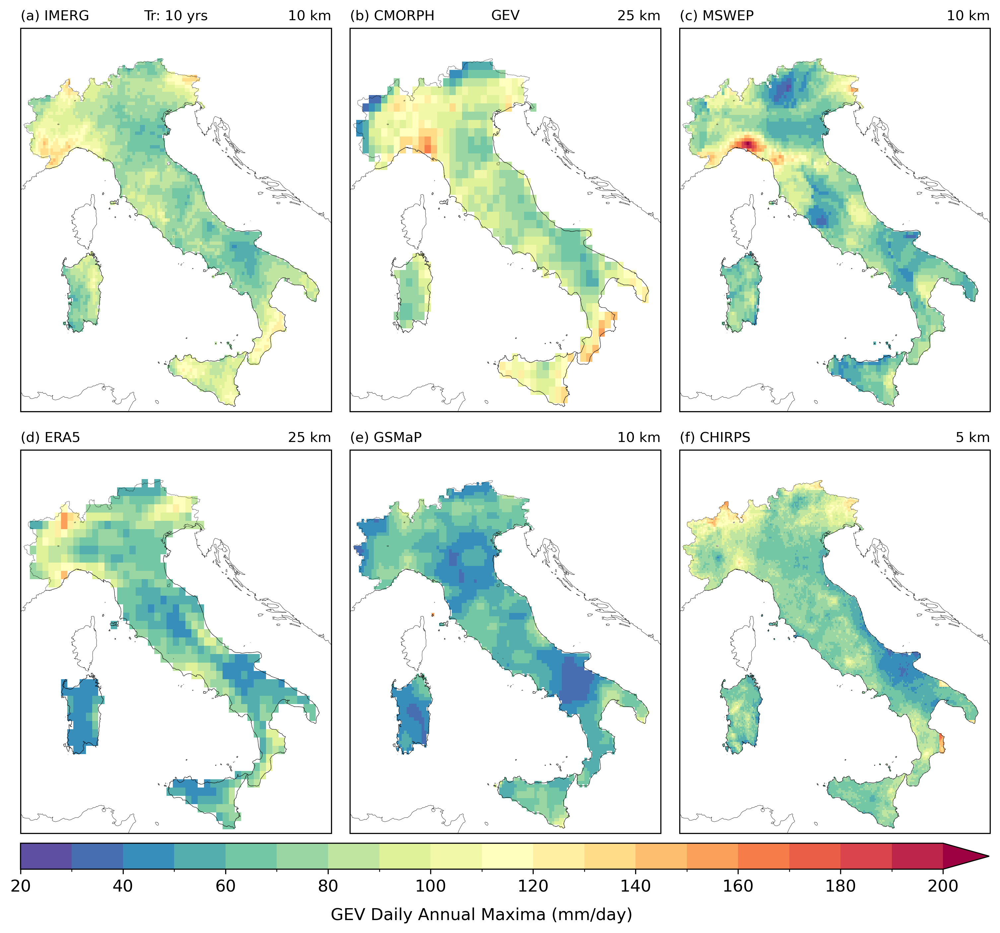

In [40]:
pos = 1
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 210, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, IMERG_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, CMORPH_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MSWEP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, ERA5_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, GSMaP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, CHIRPS_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'GEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("GEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'GEV_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


Return Time: 50 years
Export figure to: ../figures/INTENSE/GEV_50yrs_raw_scale.png


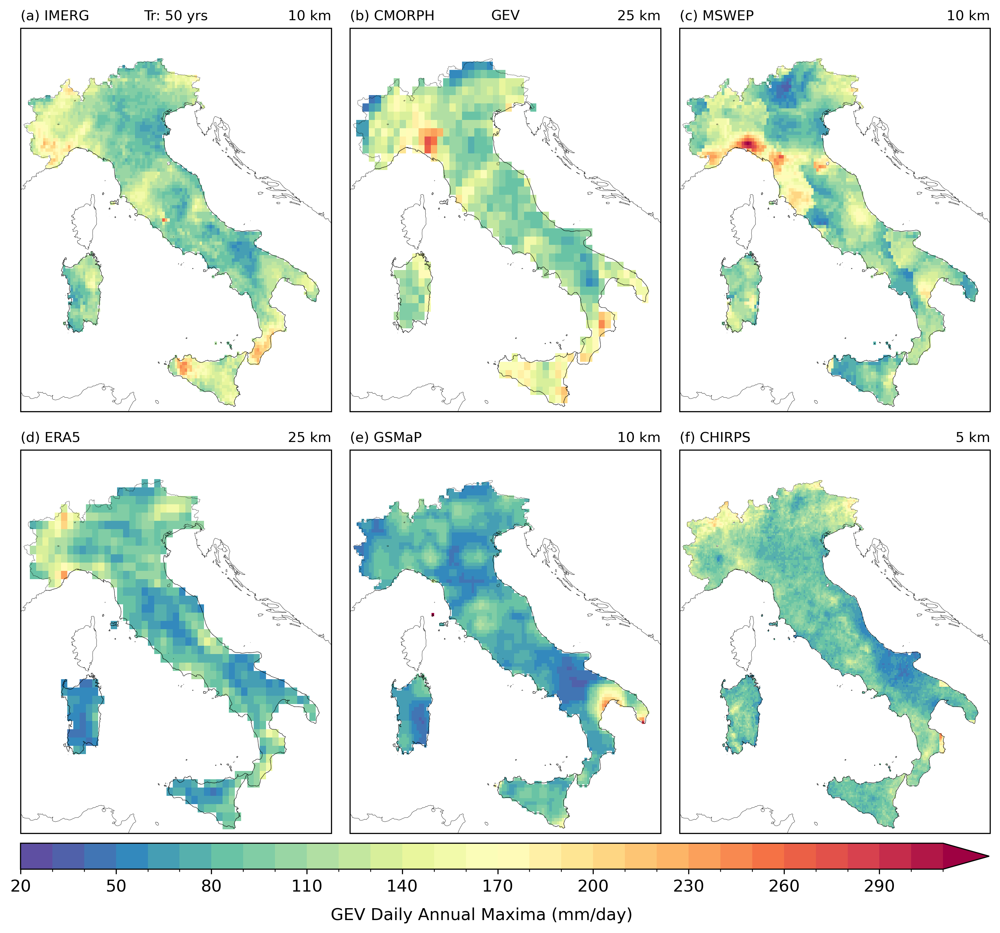

In [41]:
pos = 3
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 320, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, IMERG_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, CMORPH_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MSWEP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, ERA5_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, GSMaP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, CHIRPS_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'GEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("GEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'GEV_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


Return Time: 100 years
Export figure to: ../figures/INTENSE/GEV_100yrs_raw_scale.png


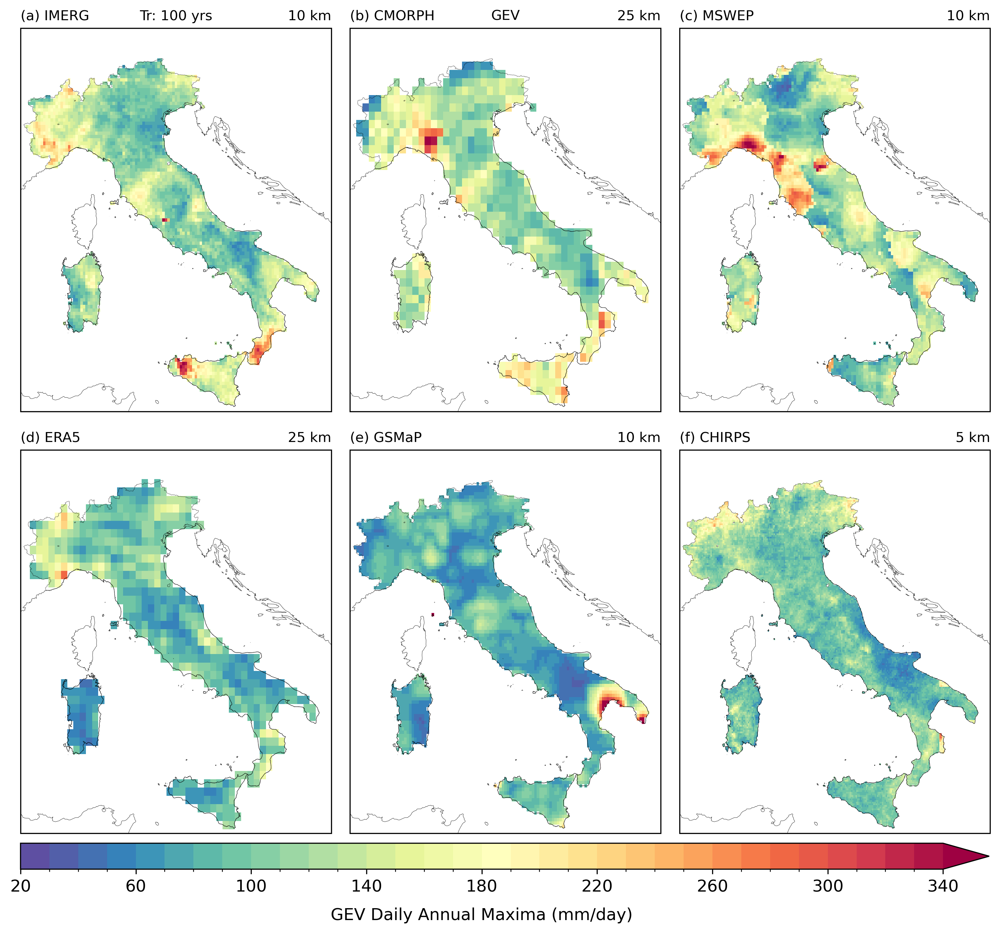

In [42]:
pos = 4
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 350, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, IMERG_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, CMORPH_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MSWEP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, ERA5_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, GSMaP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, CHIRPS_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'GEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("GEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'GEV_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


Return Time: 200 years
Export figure to: ../figures/INTENSE/GEV_200yrs_raw_scale.png


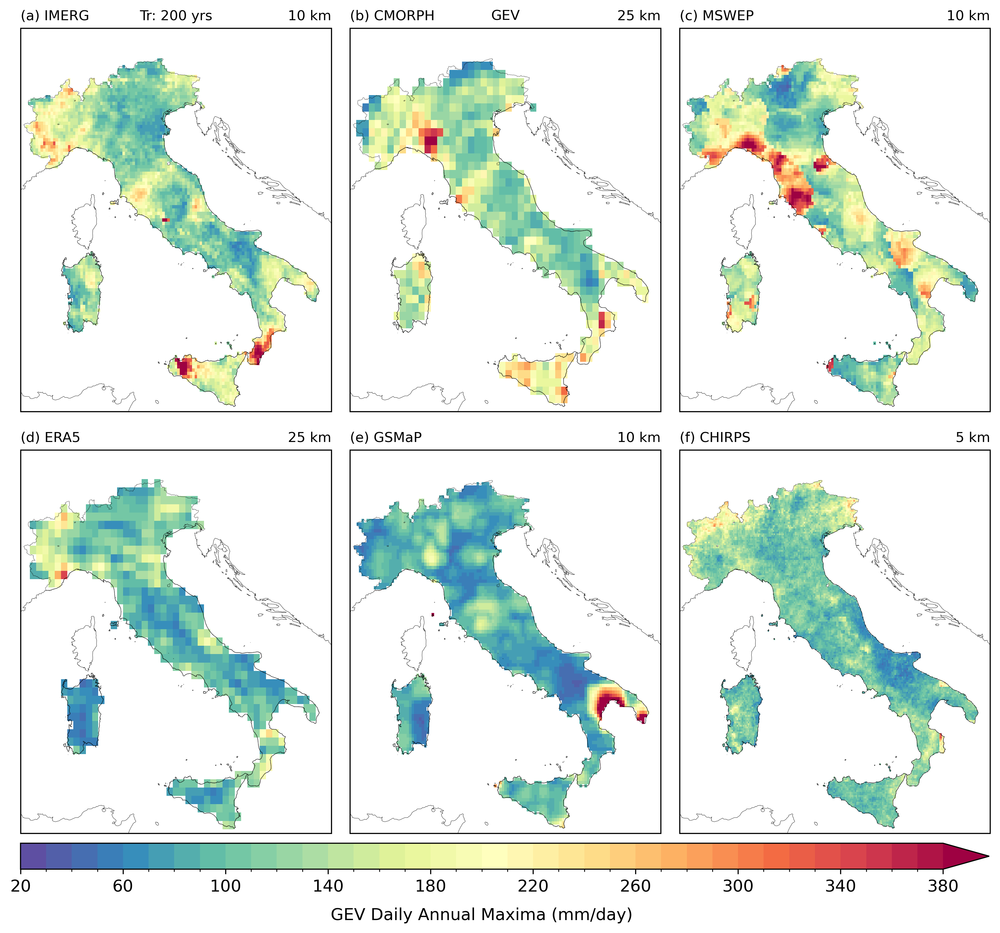

In [43]:
pos = 5
print(f'Return Time: {Tr[pos]} years')

Mev_levels = np.arange(20, 390, 10)
fonttitle = 10

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, IMERG_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, CMORPH_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MSWEP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, ERA5_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, GSMaP_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, CHIRPS_GEV[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='center')
axes[0].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'GEV', fontsize=fonttitle, loc='center')
axes[1].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[2].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[3].set_title(f'25 km', fontsize=fonttitle, loc='right')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[4].set_title(f'10 km', fontsize=fonttitle, loc='right')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')
axes[5].set_title(f'5 km', fontsize=fonttitle, loc='right')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("GEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','INTENSE',f'GEV_{Tr[pos]}yrs_raw_scale.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)